In [1]:
import re

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from shared import Benchmark, Run, Group, InputSize

from pathlib import Path
from typing import List, Tuple, Dict

benchmark = Benchmark.load(Path.cwd().parent / "benchmarking" / "args_test" / "gpulab_args_test")

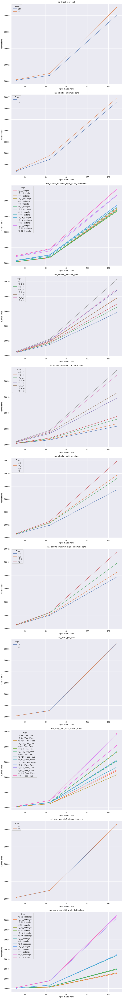

In [8]:
group = benchmark.groups["one_to_one"]

data = pd.concat([run.data for run in group.runs], axis=0, ignore_index=True)

data = data[data["Input matrix rows"] < 256]

grouped = data.groupby(["Name", "Args", "Input matrix rows"])



kernel_times = grouped["Kernel"].mean() / 1e9
kernel_times.name = "Kernel time"
results = kernel_times.reset_index().sort_values("Kernel time")

sns.set(rc={'figure.figsize': (10, 80)})
fig, axs = plt.subplots(nrows=results["Name"].nunique())
for idx, name in enumerate(sorted(results["Name"].unique())):
    filtered_result = results[results["Name"] == name]
    ax = sns.lineplot(data=filtered_result, x="Input matrix rows", y="Kernel time", hue="Args", marker='o', ax=axs[idx])

    ax.set_title(f"{name}")
fig.tight_layout()

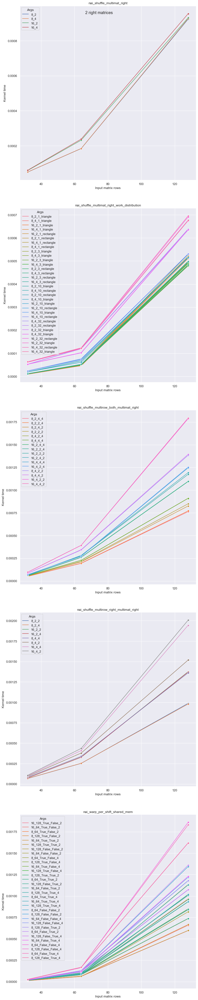

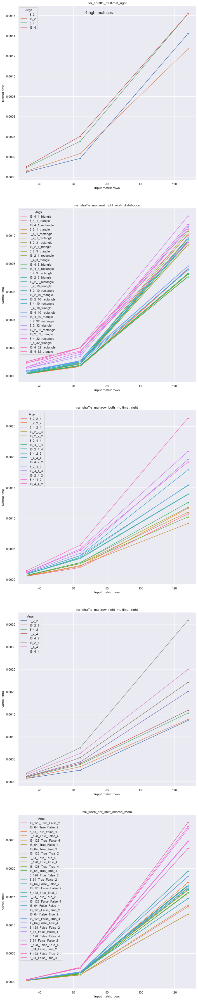

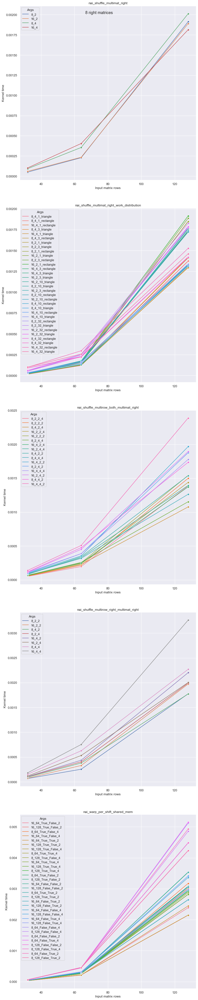

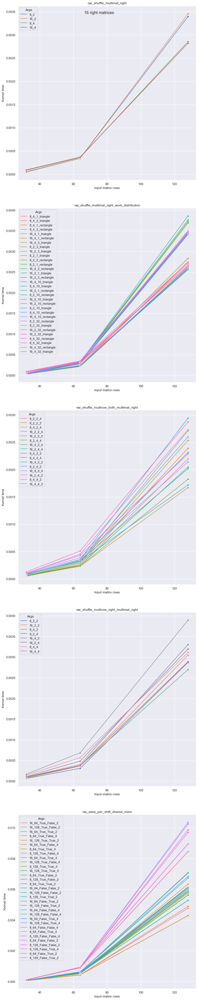

In [13]:
group = benchmark.groups["one_to_many"]

data = pd.concat([run.data for run in group.runs], axis=0, ignore_index=True)

data = data[data["Input matrix rows"] < 256]

grouped = data.groupby(["Name", "Args", "Input right matrices", "Input matrix rows"])



kernel_times = grouped["Kernel"].mean() / 1e9
kernel_times.name = "Kernel time"
results = kernel_times.reset_index().sort_values("Kernel time")

sns.set(rc={'figure.figsize': (10, 50)})

for num_rights in sorted(results["Input right matrices"].unique()):
    right_results = results[results["Input right matrices"] == num_rights]
    fig, axs = plt.subplots(nrows=right_results["Name"].nunique())
    for idx, name in enumerate(sorted(right_results["Name"].unique())):
        filtered_result = right_results[right_results["Name"] == name]
        ax = sns.lineplot(data=filtered_result, x="Input matrix rows", y="Kernel time", hue="Args", marker='o', ax=axs[idx])

        ax.set_title(f"{name}")
    fig.suptitle(f"{num_rights} right matrices")
    fig.tight_layout()

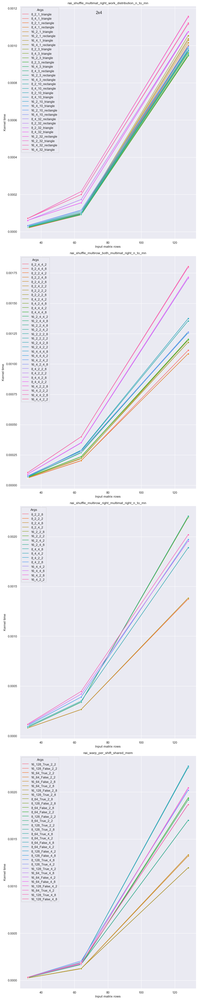

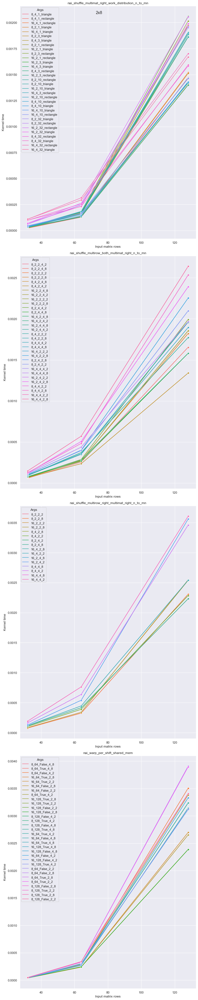

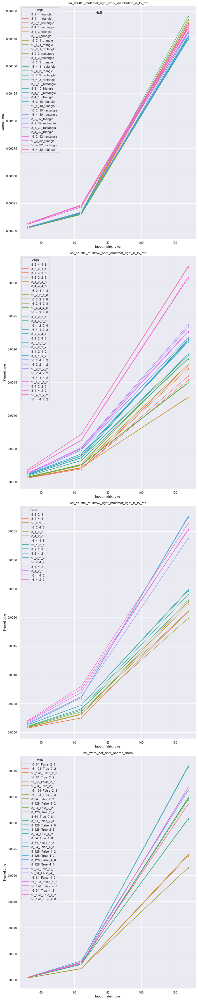

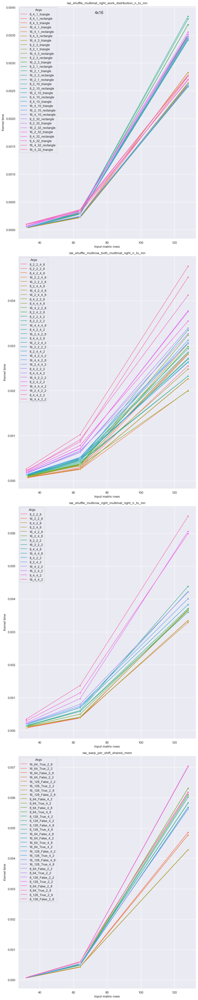

In [17]:
group = benchmark.groups["n_to_mn"]

data = pd.concat([run.data for run in group.runs], axis=0, ignore_index=True)

data = data[data["Input matrix rows"] < 256]

grouped = data.groupby(["Name", "Args", "Input left matrices", "Input right matrices", "Input matrix rows"])

kernel_times = grouped["Kernel"].mean() / 1e9
kernel_times.name = "Kernel time"
results = kernel_times.reset_index().sort_values("Kernel time")

sns.set(rc={'figure.figsize': (10, 50)})

for num_lefts in sorted(results["Input left matrices"].unique()):
    left_results = results[results["Input left matrices"] == num_lefts]
    for num_rights in sorted(left_results["Input right matrices"].unique()):
        right_results = left_results[left_results["Input right matrices"] == num_rights]
        fig, axs = plt.subplots(nrows=right_results["Name"].nunique())
        for idx, name in enumerate(sorted(right_results["Name"].unique())):
            filtered_result = right_results[right_results["Name"] == name]
            ax = sns.lineplot(data=filtered_result, x="Input matrix rows", y="Kernel time", hue="Args", marker='o',
                              ax=axs[idx])

            ax.set_title(f"{name}")
        fig.suptitle(f"{num_lefts}x{num_rights}")
        fig.tight_layout()

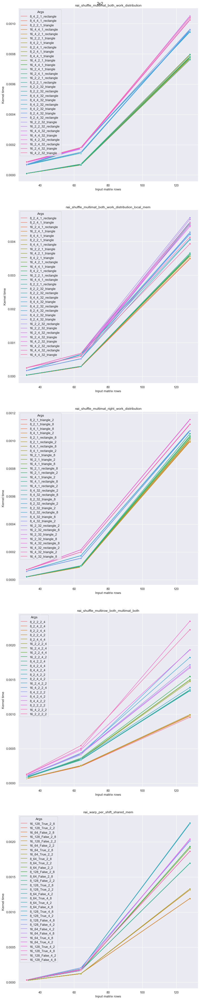

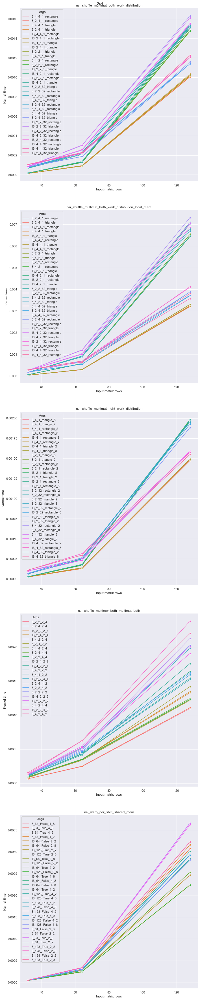

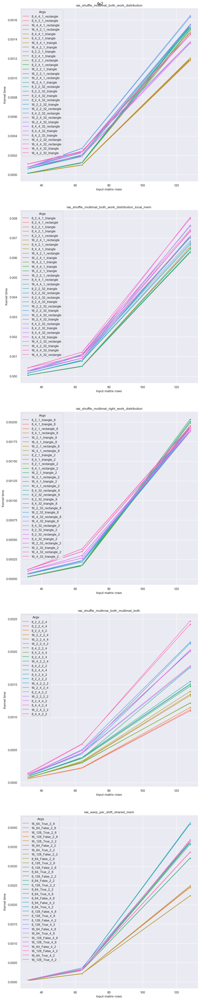

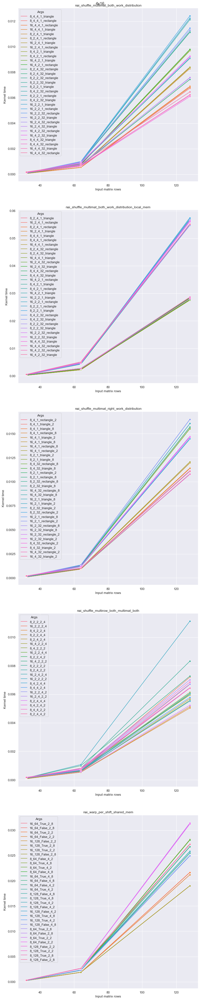

In [2]:
group = benchmark.groups["n_to_m"]

data = pd.concat([run.data for run in group.runs], axis=0, ignore_index=True)

data = data[data["Input matrix rows"] < 256]

grouped = data.groupby(["Name", "Args", "Input left matrices", "Input right matrices", "Input matrix rows"])

kernel_times = grouped["Kernel"].mean() / 1e9
kernel_times.name = "Kernel time"
results = kernel_times.reset_index().sort_values("Kernel time")

sns.set(rc={'figure.figsize': (10, 50)})

for num_lefts in sorted(results["Input left matrices"].unique()):
    left_results = results[results["Input left matrices"] == num_lefts]
    for num_rights in sorted(left_results["Input right matrices"].unique()):
        right_results = left_results[left_results["Input right matrices"] == num_rights]
        fig, axs = plt.subplots(nrows=right_results["Name"].nunique())
        for idx, name in enumerate(sorted(right_results["Name"].unique())):
            filtered_result = right_results[right_results["Name"] == name]
            ax = sns.lineplot(data=filtered_result, x="Input matrix rows", y="Kernel time", hue="Args", marker='o',
                              ax=axs[idx])

            ax.set_title(f"{name}")
        fig.suptitle(f"{num_lefts}x{num_rights}")
        fig.tight_layout()